In [16]:
import numpy as np 
import pandas as pd 

import os
for dirname, _, filenames in os.walk('/home/prostoi/Загрузки/crops'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        break

/home/prostoi/Загрузки/crops/Crop_details.csv
/home/prostoi/Загрузки/crops/some_more_images/some_more_images/rice/rice046a.jpg
/home/prostoi/Загрузки/crops/some_more_images/some_more_images/Wheat/wheat042a.JPG
/home/prostoi/Загрузки/crops/some_more_images/some_more_images/jute/jute048a.jpg
/home/prostoi/Загрузки/crops/some_more_images/some_more_images/sugarcane/sugarcane047a.jpg
/home/prostoi/Загрузки/crops/some_more_images/some_more_images/maize/maize045a.jpg
/home/prostoi/Загрузки/crops/crop_images/rice/rice006a.jpeg
/home/prostoi/Загрузки/crops/crop_images/jute/jute006a.jpeg
/home/prostoi/Загрузки/crops/crop_images/sugarcane/sugarcane016a.jpeg
/home/prostoi/Загрузки/crops/crop_images/maize/maize040a.jpeg
/home/prostoi/Загрузки/crops/crop_images/wheat/wheat0001a.jpeg
/home/prostoi/Загрузки/crops/kag2/rice/rice036ahf.jpeg
/home/prostoi/Загрузки/crops/kag2/jute/jute024ahf.jpeg
/home/prostoi/Загрузки/crops/kag2/sugarcane/sugarcane016a.jpeg
/home/prostoi/Загрузки/crops/kag2/maize/maize02

In [17]:
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf 
import keras 
from keras.layers import Conv2D
from keras.models import Sequential
from keras.layers import MaxPool2D
from keras.layers import Flatten
from keras.layers import Dense
from keras.models import Model
from keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
import cv2
import re
import random
random.seed(0)
np.random.seed(0)

Text(0.5, 1.0, 'wheat')

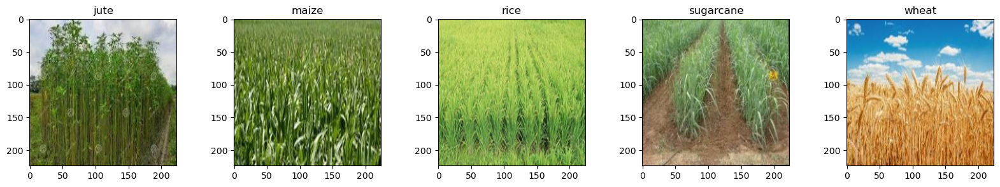

In [18]:
wheat = plt.imread("/home/prostoi/Загрузки/crops/kag2/wheat/wheat0004a.jpeg")
jute = plt.imread("/home/prostoi/Загрузки/crops/kag2/jute/jute005a.jpeg")
cane = plt.imread("/home/prostoi/Загрузки/crops/kag2/sugarcane/sugarcane0010arot.jpeg")
rice = plt.imread("/home/prostoi/Загрузки/crops/kag2/rice/rice032ahs.jpeg")
maize = plt.imread("/home/prostoi/Загрузки/crops/kag2/maize/maize003a.jpeg")
plt.figure(figsize=(20,3))
plt.subplot(1,5,1)
plt.imshow(jute)
plt.title("jute")
plt.subplot(1,5,2)
plt.imshow(maize)
plt.title("maize")
plt.subplot(1,5,3)
plt.imshow(rice)
plt.title("rice")
plt.subplot(1,5,4)
plt.imshow(cane)
plt.title("sugarcane")
plt.subplot(1,5,5)
plt.imshow(wheat)
plt.title("wheat")

In [19]:
jutepath = "/home/prostoi/Загрузки/crops/kag2/jute"
maizepath = "/home/prostoi/Загрузки/crops/kag2/maize"
ricepath = "/home/prostoi/Загрузки/crops/kag2/rice"
sugarcanepath = "/home/prostoi/Загрузки/crops/kag2/sugarcane"
wheatpath = "/home/prostoi/Загрузки/crops/kag2/wheat"

jutefilename = os.listdir(jutepath)
maizefilename = os.listdir(maizepath)
ricefilename = os.listdir(ricepath)
sugarcanefilename = os.listdir(sugarcanepath)
wheatfilename = os.listdir(wheatpath)

X= []

In [20]:
for fname in jutefilename:
    X.append([os.path.join(jutepath,fname),0])
for fname in maizefilename:
    X.append([os.path.join(maizepath,fname),1])
for fname in ricefilename:
    X.append([os.path.join(ricepath,fname),2])
for fname in sugarcanefilename:
    X.append([os.path.join(sugarcanepath,fname),3]) 
for fname in wheatfilename:
    X.append([os.path.join(wheatpath,fname),4])  
X = pd.DataFrame(X,columns = ['path','labels'])   

In [21]:
X.head()

,path,labels
0,/home/prostoi/Загрузки/crops/kag2/jute/jute024...,0
1,/home/prostoi/Загрузки/crops/kag2/jute/jute007...,0
2,/home/prostoi/Загрузки/crops/kag2/jute/jute008...,0
3,/home/prostoi/Загрузки/crops/kag2/jute/jute014...,0
4,/home/prostoi/Загрузки/crops/kag2/jute/jute006...,0


In [22]:
ohencoder = OneHotEncoder(handle_unknown='ignore',sparse=False)
ohlabel = pd.DataFrame(ohencoder.fit_transform(X[['labels']]),dtype = 'float64',columns = ['label0','label1','label2','label3','label4'])
label_X = X.copy()
X = pd.concat([X,ohlabel],axis = 1)
new_X = X.drop(['labels'],axis = 1)

In [23]:
train,test = train_test_split(new_X,test_size=0.2,random_state=32,shuffle = True)

In [24]:
X_train = train['path'].values
y_train = train.drop(['path'],axis=1).values
X_test = test['path'].values
y_test = test.drop(['path'],axis=1).values

In [25]:
def deep_pipeline(data):
    flat = []
    for i in data:
        img = plt.imread(i)
        img = img/255.
        flat.append(img)
    flat =  np.array(flat)    
    flat = flat.reshape(-1,224,224,3)       
    return flat

In [26]:
dx_train = deep_pipeline(X_train)
dx_test = deep_pipeline(X_test)

In [27]:
keras.backend.clear_session()
vgg = keras.applications.VGG19(input_shape=(224,224,3),include_top=False,weights = 'imagenet',pooling='avg')
vgg.trainable = False
vggmodel = keras.Sequential([vgg
                         ,Dense(1000,activation='tanh'),Dense(1000,activation='tanh'),Dense(1000,activation='tanh'),Dense(5,activation='softmax')])

vggmodel.compile(optimizer = 'adam',loss = 'categorical_crossentropy',metrics=['accuracy'])
vggmodel.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 512)               20024384  
                                                                 
 dense (Dense)               (None, 1000)              513000    
                                                                 
 dense_1 (Dense)             (None, 1000)              1001000   
                                                                 
 dense_2 (Dense)             (None, 1000)              1001000   
                                                                 
 dense_3 (Dense)             (None, 5)                 5005      
                                                                 
Total params: 22,544,389
Trainable params: 2,520,005
Non-trainable params: 20,024,384
_________________________________________________________________


In [29]:
hist = vggmodel.fit(dx_train,y_train,epochs=10,validation_split=0.3,batch_size=16)

Epoch 1/10
29/29 [==============================] - 83s 3s/step - loss: 0.2662 - accuracy: 0.9022 - val_loss: 0.8510 - val_accuracy: 0.7513
Epoch 2/10
29/29 [==============================] - 85s 3s/step - loss: 0.3965 - accuracy: 0.8622 - val_loss: 0.7937 - val_accuracy: 0.7668
Epoch 3/10
29/29 [==============================] - 81s 3s/step - loss: 0.5865 - accuracy: 0.8200 - val_loss: 0.8505 - val_accuracy: 0.7150
Epoch 4/10
29/29 [==============================] - 80s 3s/step - loss: 0.8485 - accuracy: 0.7178 - val_loss: 1.7094 - val_accuracy: 0.6166
Epoch 5/10
29/29 [==============================] - 80s 3s/step - loss: 0.5001 - accuracy: 0.8444 - val_loss: 0.9134 - val_accuracy: 0.7358
Epoch 6/10
29/29 [==============================] - 80s 3s/step - loss: 0.2700 - accuracy: 0.9044 - val_loss: 0.9181 - val_accuracy: 0.7358
Epoch 7/10
29/29 [==============================] - 81s 3s/step - loss: 0.3058 - accuracy: 0.8822 - val_loss: 1.0851 - val_accuracy: 0.7306
Epoch 8/10
29/29 [==

(0.0, 4.0)

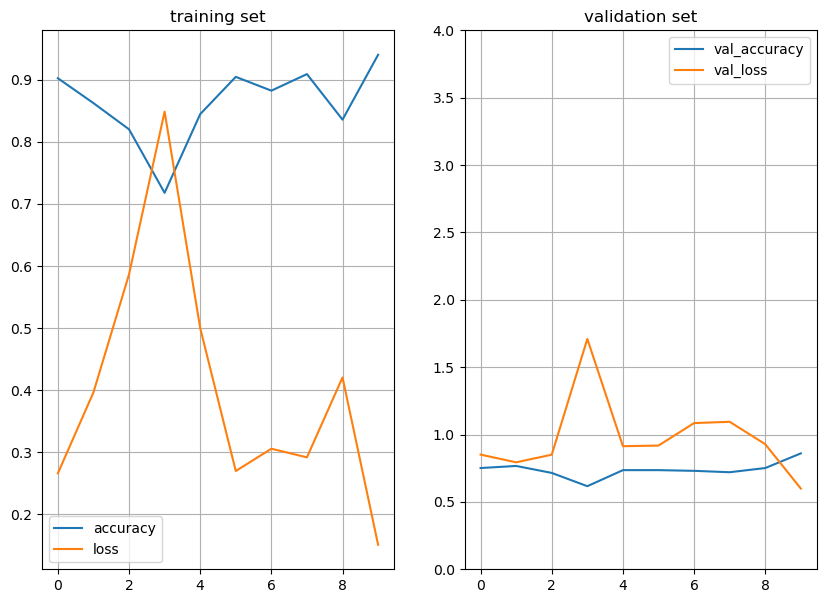

In [30]:
plt.figure(figsize=(10,7))
plt.subplot(1,2,1)
plt.plot(hist.history['accuracy'],label='accuracy')
plt.plot(hist.history['loss'],label='loss')
plt.legend()
plt.title("training set")
plt.grid()
plt.subplot(1,2,2)
plt.plot(hist.history['val_accuracy'],label='val_accuracy')
plt.plot(hist.history['val_loss'],label='val_loss')
plt.legend()
plt.title("validation set")
plt.grid()
plt.ylim((0,4))

In [31]:
score = vggmodel.evaluate(dx_test,y_test)
print("accuracy: ", score[1])

6/6 [==============================] - 17s 3s/step - loss: 0.3834 - accuracy: 0.9317
accuracy:  0.9316770434379578


In [32]:
pred = vggmodel.predict(dx_test)
prediction = np.argmax(pred,axis=1)
true = np.argmax(y_test,axis=1)
best_prob = [pred[num,:][i] for num,i in enumerate(prediction)]

6/6 [==============================] - 19s 3s/step


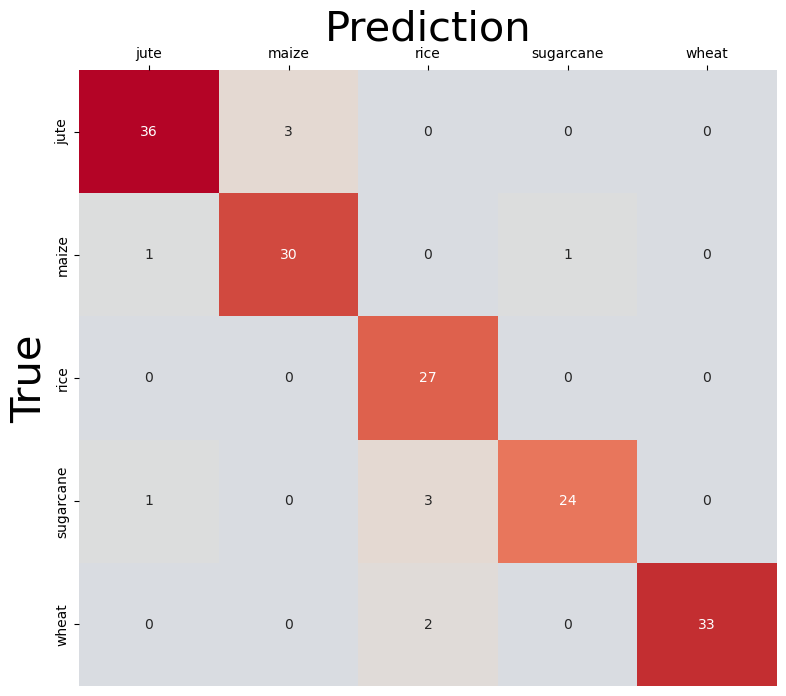

In [33]:
plt.figure(figsize = (9,8))
class_label = ['jute','maize','rice','sugarcane','wheat']
fig = sns.heatmap(confusion_matrix(true,prediction),cmap= "coolwarm",annot=True,vmin=0,cbar = False,
            center = True,xticklabels=class_label,yticklabels=class_label)
fig.set_xlabel("Prediction",fontsize=30)
fig.xaxis.set_label_position('top')
fig.set_ylabel("True",fontsize=30)
fig.xaxis.tick_top()

In [34]:
def deepmodelpipeline(imagepath,model = vggmodel,label=[-1]):
    pdict = {0:"jute",1:"maize",2:"rice",3:"sugarcane",4:"wheat"}
    pred_x = deep_pipeline([imagepath])
    prediction = model.predict(pred_x)
    pred = np.argmax(prediction[0])
    plt.imshow(plt.imread(imagepath))
    if (label[0]!=-1):
        plt.title("prediction : {0} % {1:.2f} \ntrue        : {2}".format(pdict[pred],prediction[0,pred]*100,pdict[np.argmax(label)]))
    else:
        plt.title("prediction : {0}, % {1:.2f}".format(pdict[pred],prediction[0,pred]*100))

1/1 [==============================] - 0s 129ms/step


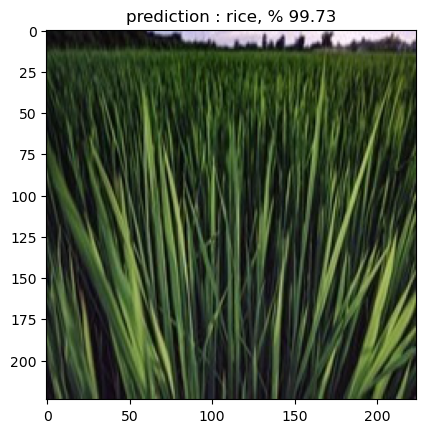

In [35]:
deepmodelpipeline('/home/prostoi/Загрузки/crops/kag2/rice/rice024ahs.jpeg')

1/1 [==============================] - 0s 130ms/step


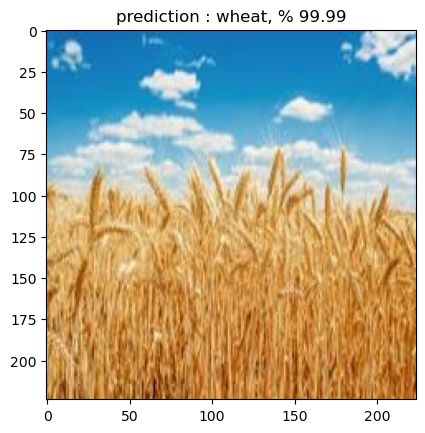

In [36]:
deepmodelpipeline('/home/prostoi/Загрузки/crops/kag2/wheat/wheat0004a.jpeg')

1/1 [==============================] - 0s 131ms/step


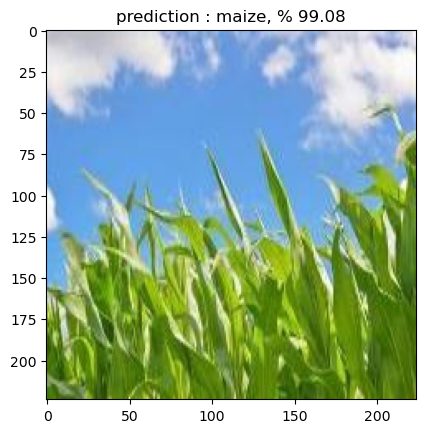

In [37]:
deepmodelpipeline("/home/prostoi/Загрузки/crops/kag2/maize/maize008ahf.jpeg")

1/1 [==============================] - 0s 135ms/step


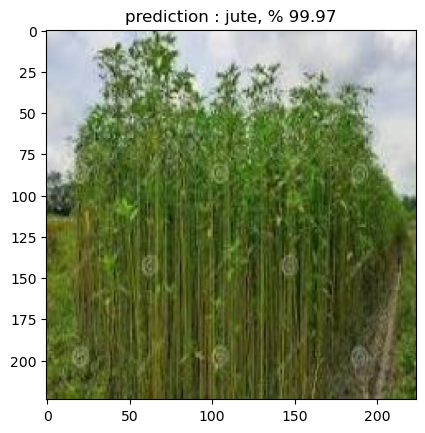

In [38]:
deepmodelpipeline("/home/prostoi/Загрузки/crops/kag2/jute/jute005a.jpeg")

1/1 [==============================] - 0s 234ms/step


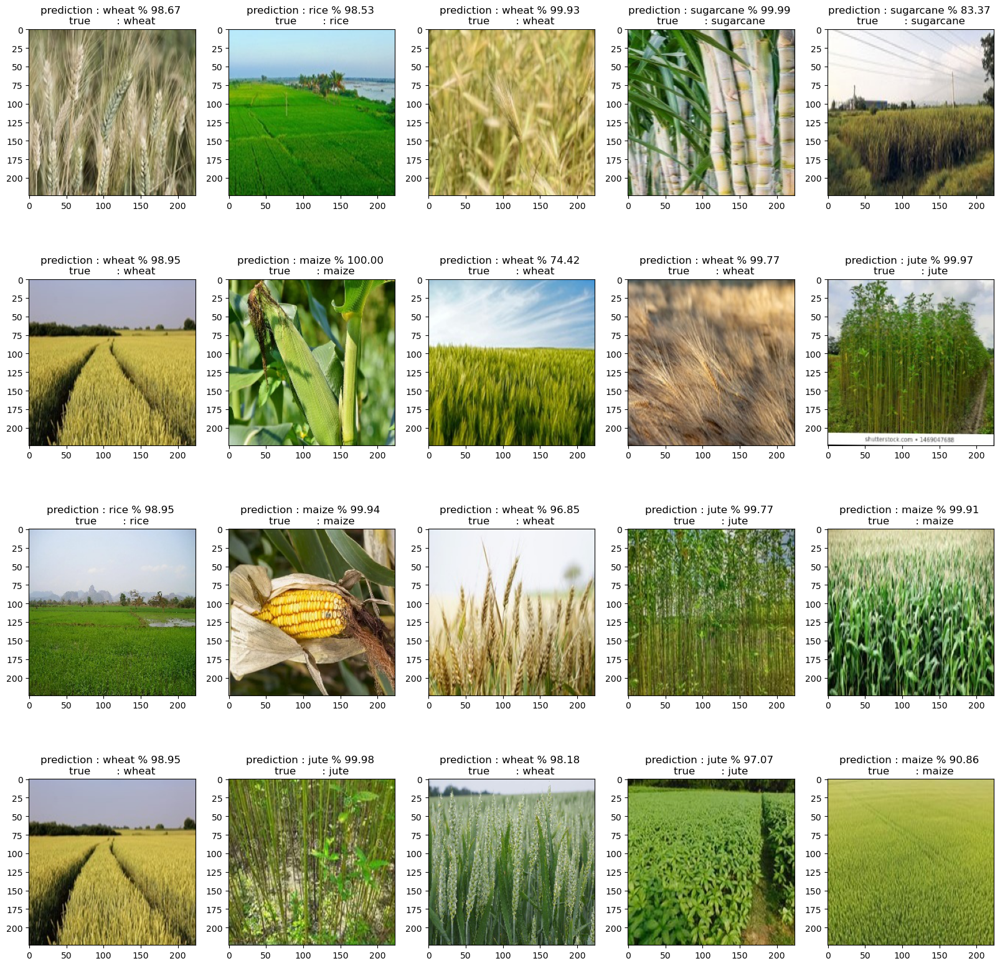

In [39]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[0:20]):
    plt.subplot(4,5,num+1)
    deepmodelpipeline(path,vggmodel,y_test[num])

1/1 [==============================] - 0s 222ms/step


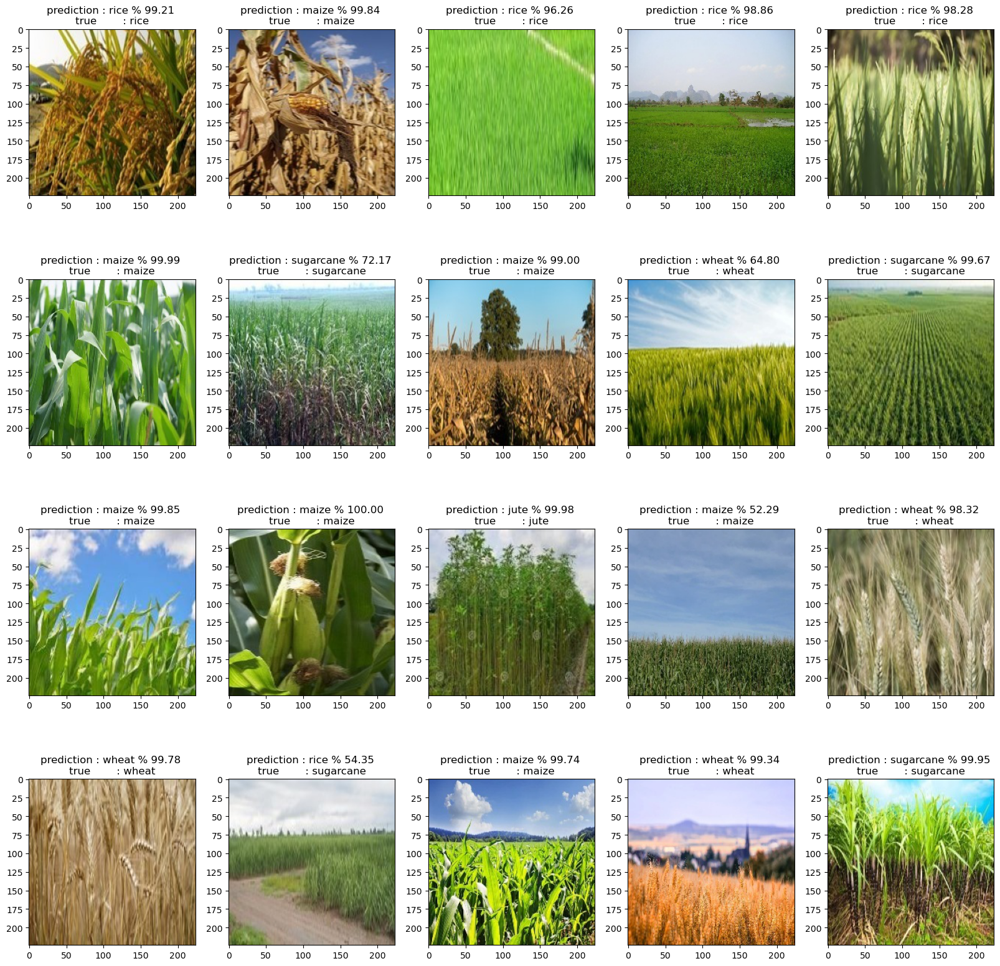

In [40]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[40:60]):
    plt.subplot(4,5,num+1)
    deepmodelpipeline(path,vggmodel,y_test[num+40])

1/1 [==============================] - 0s 193ms/step


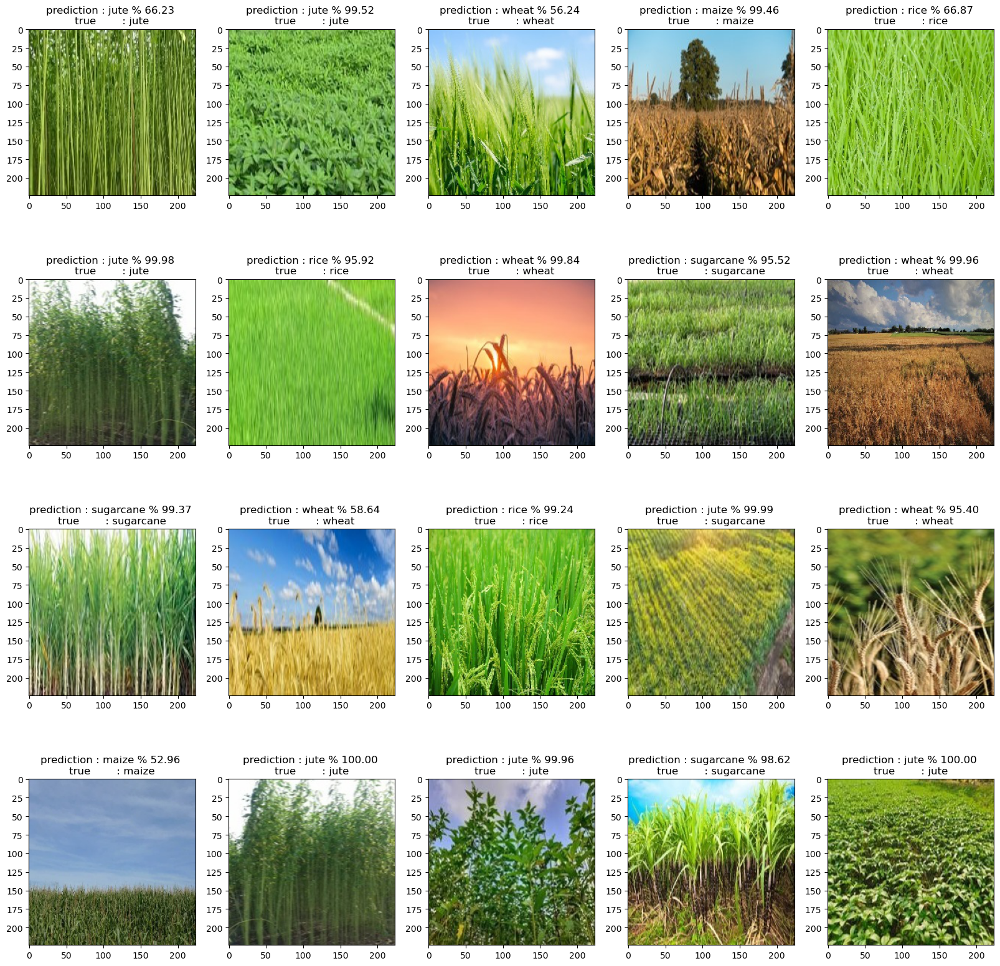

In [41]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[100:120]):
    plt.subplot(4,5,num+1)
    deepmodelpipeline(path,vggmodel,y_test[num+100])

1/1 [==============================] - 0s 312ms/step


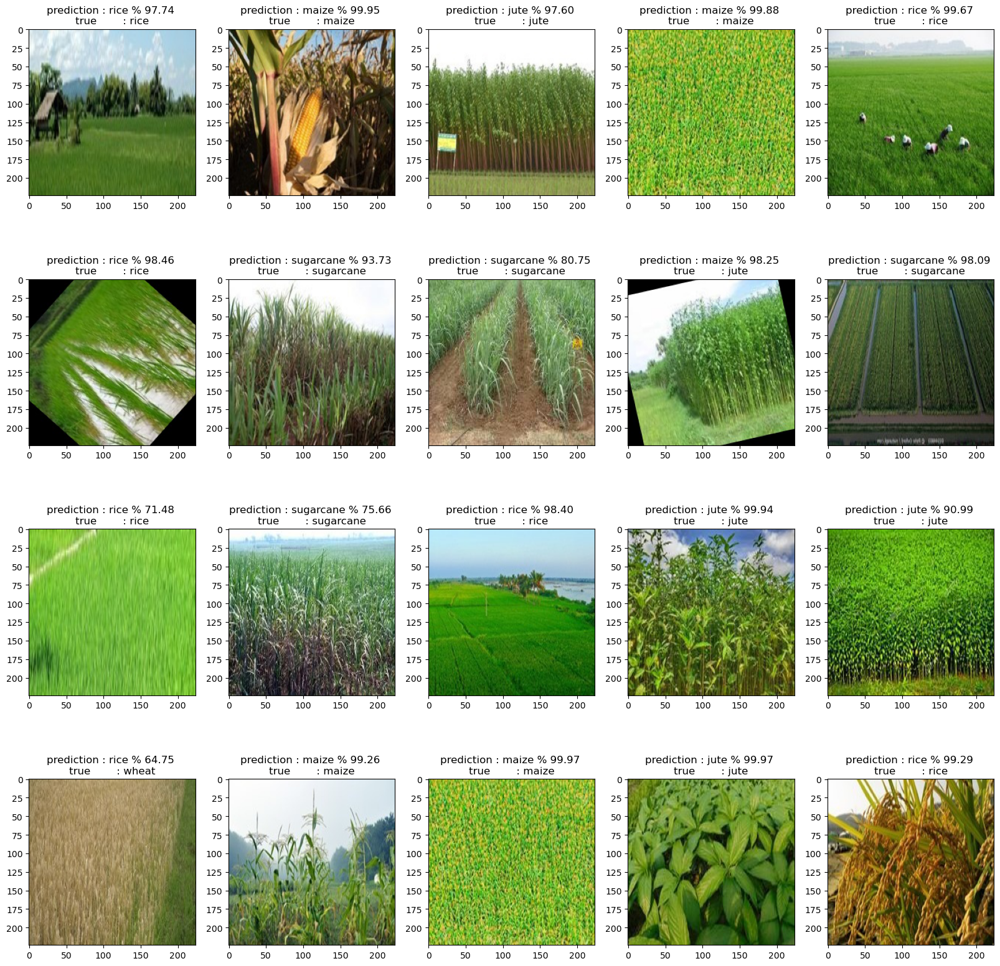

In [42]:
plt.figure(figsize=(20,20))
for num,path in enumerate(X_test[140:160]):
    plt.subplot(4,5,num+1)
    deepmodelpipeline(path,vggmodel,y_test[num+140])

In [43]:
vggmodel.save_weights("CropScan.h5")